# Traffic light detection

In [1]:
import tensorflow as tf
if tf.__version__ != '1.4.0':
  raise ImportError('Please upgrade your tensorflow installation to v1.4.0!')
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from PIL import ImageDraw
from PIL import ImageColor
import time
from scipy.stats import norm
import os
import urllib
import tarfile

%matplotlib inline
plt.style.use('ggplot')

## Prepare models
We'll use pretrained models from the [model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md).

In [2]:
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
MODEL_DATE = '_2017_11_08'
MODEL_NAMES=[
    'ssd_mobilenet_v1_coco',
    'ssd_inception_v2_coco',
    'faster_rcnn_inception_v2_coco',
    'faster_rcnn_resnet50_coco',
    'faster_rcnn_resnet50_lowproposals_coco',
    'rfcn_resnet101_coco',
    'faster_rcnn_resnet101_coco',
    'faster_rcnn_resnet101_lowproposals_coco',
    'faster_rcnn_inception_resnet_v2_atrous_coco',
    'faster_rcnn_inception_resnet_v2_atrous_lowproposals_coco',
    'faster_rcnn_nas_coco',
    'faster_rcnn_nas_lowproposals_coco'
]
MODELS_DIR='/data/ab/tl/models'
print("Prepare models:")

if not os.path.exists(MODELS_DIR):
    os.makedirs(MODELS_DIR)
model_directories = os.listdir(MODELS_DIR)

for model_name in MODEL_NAMES:
    if model_name+MODEL_DATE not in model_directories:
        opener = urllib.request.URLopener()
        model_file = model_name + MODEL_DATE + '.tar.gz'
        deployed_model = os.path.join(MODELS_DIR,model_file)
        print("\tdownloading", model_file)
        opener.retrieve(DOWNLOAD_BASE + model_file,deployed_model)
        tar_file = tarfile.open(deployed_model)
        for file in tar_file.getmembers():
            file_name = os.path.basename(file.name)
            tar_file.extract(file, MODELS_DIR)

print("Models prepared")                

Prepare models:
Models prepared


## Helper functions

Below are utility functions. The main purpose of these is to filter the network results and draw the bounding boxes back onto the original image.

In [3]:
# Colors (one for each class)
cmap = ImageColor.colormap

COLOR_LIST = sorted([c for c in cmap.keys()])

#
# Utility funcs
#
def filter_boxes(min_score, boxes, scores, classes, categories):
    """Return boxes with a confidence >= `min_score`"""
    n = len(classes)
    idxs = []
    for i in range(n):
        if classes[i] in categories and scores[i] >= min_score:
            idxs.append(i)
    
    filtered_boxes = boxes[idxs, ...]
    filtered_scores = scores[idxs, ...]
    filtered_classes = classes[idxs, ...]
    return filtered_boxes, filtered_scores, filtered_classes

def to_image_coords(boxes, height, width):
    """
    The original box coordinate output is normalized, i.e [0, 1].
    
    This converts it back to the original coordinate based on the image
    size.
    """
    box_coords = np.zeros_like(boxes)
    box_coords[:, 0] = boxes[:, 0] * height
    box_coords[:, 1] = boxes[:, 1] * width
    box_coords[:, 2] = boxes[:, 2] * height
    box_coords[:, 3] = boxes[:, 3] * width
    
    return box_coords

def draw_boxes(image, boxes, classes, thickness=4):
    """Draw bounding boxes on the image"""
    draw = ImageDraw.Draw(image)
    for i in range(len(boxes)):
        bot, left, top, right = boxes[i, ...]
        class_id = int(classes[i])
        color = COLOR_LIST[class_id]
        draw.line([(left, top), (left, bot), (right, bot), (right, top), (left, top)], width=thickness, fill=color)
        
def ilustrate_detection(image,boxes, classes,title):
        # The current box coordinates are normalized to a range between 0 and 1.
        # This converts the coordinates actual location on the image.
        width, height = image.size
        box_coords = to_image_coords(boxes, height, width)

        # Each class with be represented by a differently colored box
        draw_boxes(image, box_coords, classes)
        fig = plt.figure(figsize=(12, 8))
        fig.suptitle(title, fontsize=10)
        plt.imshow(image) 
        

## Model functions

In [4]:
def load_graph(graph_file):
    """Loads a frozen inference graph"""
    graph = tf.Graph()
    with graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(graph_file, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
        # The input placeholder for the image.
        # `get_tensor_by_name` returns the Tensor with the associated name in the Graph.
        image_tensor = graph.get_tensor_by_name('image_tensor:0')

        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = graph.get_tensor_by_name('detection_boxes:0')

        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = graph.get_tensor_by_name('detection_scores:0')

        # The classification of the object (integer id).
        detection_classes = graph.get_tensor_by_name('detection_classes:0')
    return graph, image_tensor, detection_boxes,detection_scores,detection_classes

In [5]:
def detect(sess,
           image_tensor, 
           detection_boxes,
           detection_scores,
           detection_classes,
           image_np,
           categories,
           runs=1):
  
    # Actual detection. 
    times = np.zeros(runs)
    for i in range(runs):
        t0 = time.time()
        (boxes, scores, classes) = sess.run([detection_boxes, detection_scores, detection_classes], 
                                            feed_dict={image_tensor: image_np})
        t1 = time.time()
        times[i] = (t1 - t0) * 1000
    # Remove unnecessary dimensions
    boxes = np.squeeze(boxes)
    scores = np.squeeze(scores)
    classes = np.squeeze(classes)
    return boxes, scores, classes, times


## Detecting traffic lights in a test images

In [6]:
import glob
frozen_model_paths=[graph for graph in glob.iglob(MODELS_DIR+'/**/*.pb')]
image_paths=[ graph for graph in glob.iglob('test_images_nauto/*')]
traffic_sign_class_id = 10
test_image=image_paths[122]
print(test_image)
i = 0
for model in frozen_model_paths:
    print(i, model.split('/')[5])
    i += 1


test_images_nauto/010036.jpg
0 ssd_mobilenet_v1_coco_11_06_2017
1 rfcn_resnet101_coco_11_06_2017
2 faster_rcnn_inception_resnet_v2_atrous_coco_11_06_2017
3 faster_rcnn_resnet101_coco_11_06_2017
4 ssd_inception_v2_coco_11_06_2017
5 ssd_mobilenet_v1_coco_2017_11_08
6 ssd_inception_v2_coco_2017_11_08
7 faster_rcnn_inception_v2_coco_2017_11_08
8 faster_rcnn_resnet50_coco_2017_11_08
9 faster_rcnn_resnet50_lowproposals_coco_2017_11_08
10 rfcn_resnet101_coco_2017_11_08
11 faster_rcnn_resnet101_coco_2017_11_08
12 faster_rcnn_resnet101_lowproposals_coco_2017_11_08
13 faster_rcnn_inception_resnet_v2_atrous_coco_2017_11_08
14 faster_rcnn_inception_resnet_v2_atrous_lowproposals_coco_2017_11_08
15 faster_rcnn_nas_coco_2017_11_08
16 faster_rcnn_nas_lowproposals_coco_2017_11_08
17 faster_rcnn_resnet101_kitti_2017_11_08
18 faster_rcnn_resnet101_bosch_2017_11_11


testing model ssd_mobilenet_v1_coco_11_06_2017
[  3.  10.   3.  10.   3.   3.   3.   3.   3.  10.   3.  10.  10.   3.  10.
   3.  10.   3.   3.   3.   3.   3.   3.   3.   3.   3.   3.   3.  10.   3.
   8.  10.  10.  10.   8.   1.   3.   3.   3.  10.  10.  10.  10.   3.   3.
   3.  10.  10.   8.   3.  10.   3.   3.  10.  10.   3.   3.   3.  10.  10.
  10.  10.   3.   3.  10.  10.   3.   3.   3.  10.  10.   3.  62.   3.  10.
  62.  10.   3.   3.   3.  10.   3.   3.  10.   3.  10.  10.  10.   3.  62.
   3.  10.  62.   3.  62.   3.   3.   3.   3.   3.]
[ 0.93865883  0.91501462  0.90572023  0.83052927  0.71985167  0.68369138
  0.62461257  0.40809983  0.3863706   0.31281558  0.26753056  0.25278121
  0.20441553  0.19480802  0.19080907  0.18900312  0.1827559   0.17648573
  0.15720122  0.15554273  0.14856632  0.14521219  0.13802657  0.13381721
  0.13351023  0.1190125   0.10680985  0.10533975  0.09742714  0.09544886
  0.09391566  0.092233    0.0919714   0.09106311  0.08909006  0.08896376
  0.087

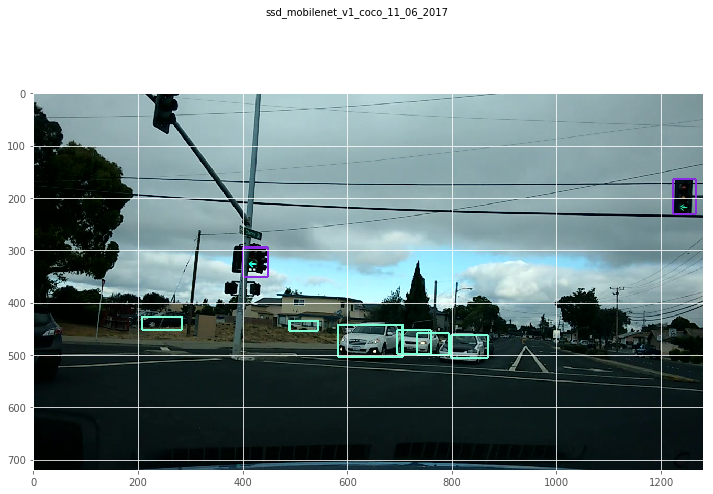

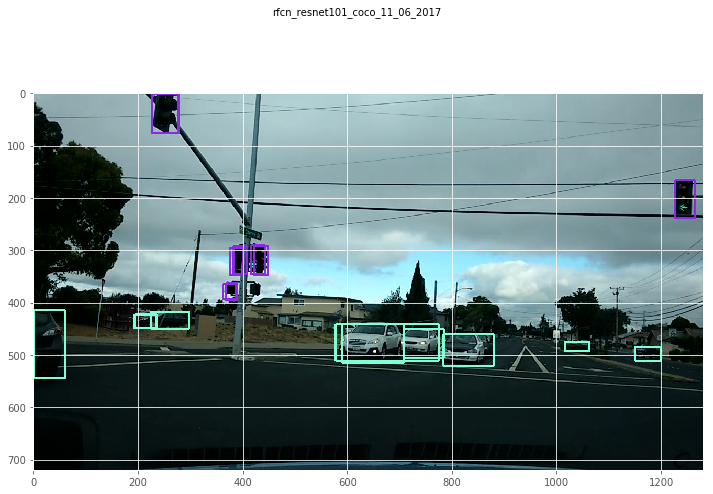

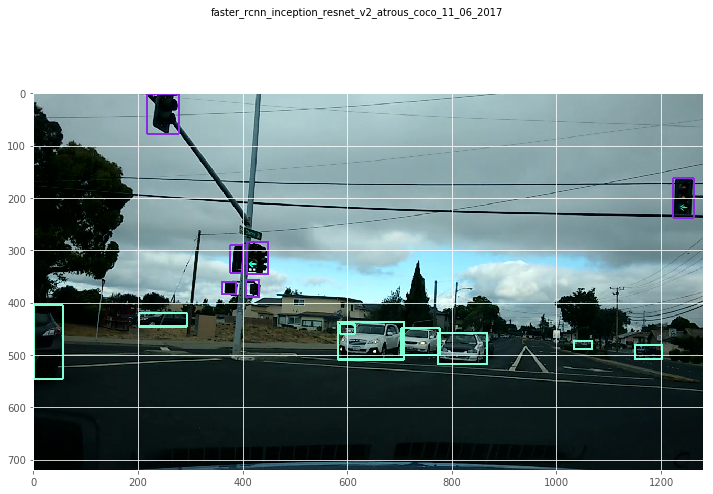

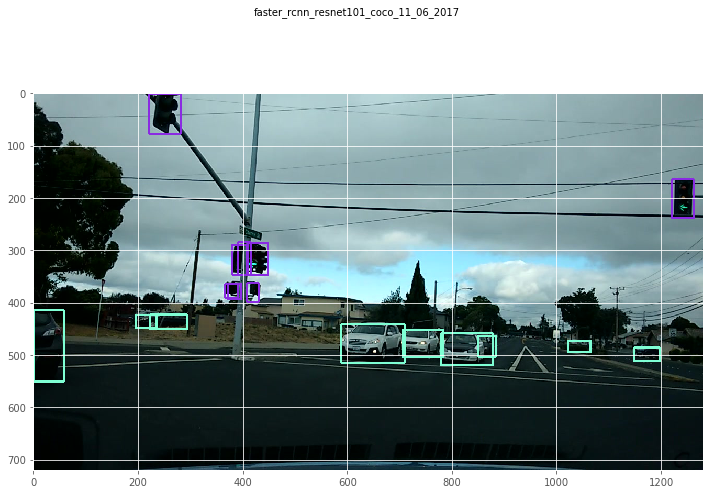

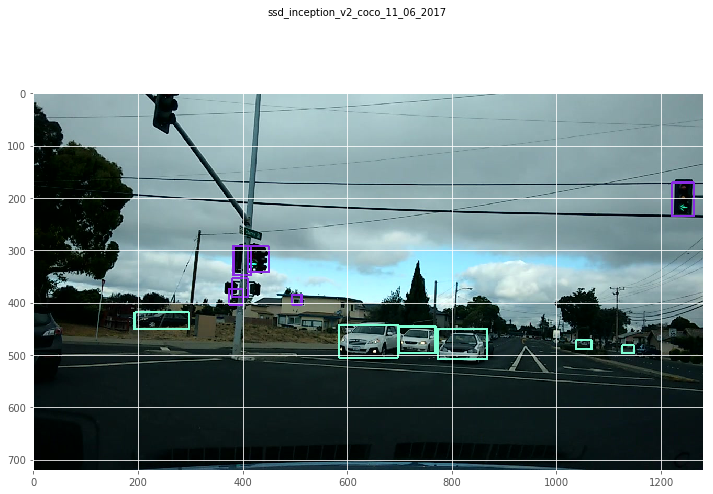

In [22]:
for model in frozen_model_paths[0:5]:
    print('testing model', model.split('/')[5])
    detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(model)
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    with tf.Session(graph=detection_graph) as sess:                
        boxes,scores,classes,times = detect(sess,
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  traffic_sign_class_id)
    print(classes)
    print(scores)
    print(times)
    confidence_cutoff = 0.4
    traffic_lights_class_id=10
    # Filter boxes with a confidence score less than `confidence_cutoff`
#     if model == frozen_model_paths[18]:
    boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,range(89))
#     else: 
#         boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,[traffic_lights_class_id])
    ilustrate_detection(image,boxes,classes,model.split('/')[5])

## Timing the models

In [ ]:
times_arr=[]
tick_arr=[]
print("Timing the models...")
for candidate_model in frozen_model_paths:
    detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(candidate_model)
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    _,_,_,times = detect(tf.Session(graph=detection_graph),
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  traffic_sign_class_id,
                                        10)
    times_arr.append(times)
    tick_arr.append(candidate_model.split('/')[5])
    print("\t=============== ", candidate_model.split('/')[5])
    print("\t", times)

print("Done timing the models.")  

Timing the models...
	===============  ssd_mobilenet_v1_coco_11_06_2017
	 [ 1233.63256454    59.18979645    48.14863205    46.33355141    44.9488163
    46.56100273    49.19600487    48.44069481    53.75170708    55.17029762]
	===============  rfcn_resnet101_coco_11_06_2017
	 [ 3753.69429588   174.69501495   160.81094742   170.01104355   176.02396011
   171.51284218   174.33309555   166.77308083   169.17061806   170.00603676]
	===============  faster_rcnn_inception_resnet_v2_atrous_coco_11_06_2017
	 [ 5558.58492851   715.00515938   718.24717522   715.23714066   715.17324448
   719.91181374   723.86240959   718.9180851    716.86458588   709.48457718]
	===============  faster_rcnn_resnet101_coco_11_06_2017
	 [ 3877.74038315   229.11143303   221.41551971   232.99145699   230.29637337
   231.4221859    229.64477539   226.35698318   231.17184639   230.1325798 ]
	===============  ssd_inception_v2_coco_11_06_2017
	 [ 2184.98468399    72.25203514    69.31734085    76.53641701    68.28570366
  

In [ ]:
import glob
frozen_model_paths=[graph for graph in glob.iglob(MODELS_DIR+'/**/*.pb')]
image_paths=[ graph for graph in glob.iglob('test_images_bosch/*')]
traffic_sign_class_id = 10
times_arr=[]
tick_arr=[]
print("Timing the models...")
num_runs = 5
for candidate_model in frozen_model_paths:
    detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(candidate_model)
    with tf.Session(graph=detection_graph) as sess:                
        for i in range(num_runs):
            test_image=image_paths[1]
            image = Image.open(test_image)
            image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
            _,_,_,times = detect(sess,
                              image_tensor,
                              detection_boxes,
                              detection_scores,
                              detection_classes,
                              image_np,
                              traffic_sign_class_id,
                                    1)
        times_arr.append(times)
        tick_arr.append(candidate_model.split('/')[5])
        print("\t=============== ", candidate_model.split('/')[5], test_image)
        print("\t", times)

print("Done timing the models.")  

In [ ]:
# Create a figure instance
fig = plt.figure(1, figsize=(9, 6))

# Create an axes instance
ax = fig.add_subplot(111)
plt.title("Object Detection Timings")
plt.ylabel("Time (ms)")

# Create the boxplot
plt.style.use('fivethirtyeight')
bp = ax.boxplot(times_arr)
plt.xticks(range(1,len(tick_arr)+1), tick_arr,rotation=90)

## Detecting traffic lights with Inception 

/data/ab/tl/models/ssd_mobilenet_v1_coco_11_06_2017/frozen_inference_graph.pb
done


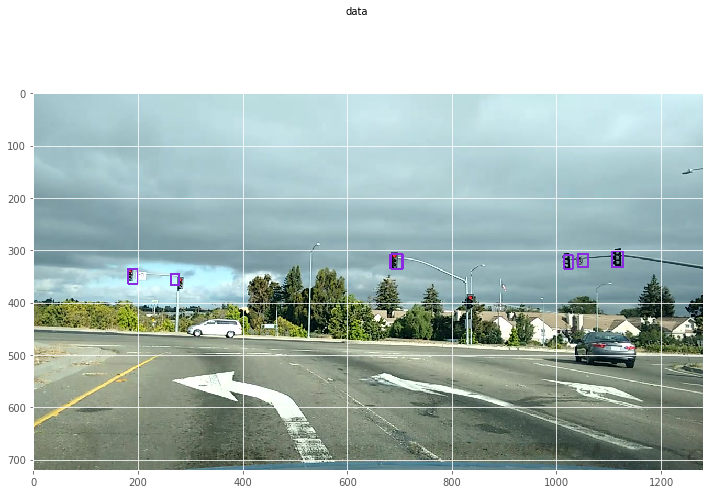

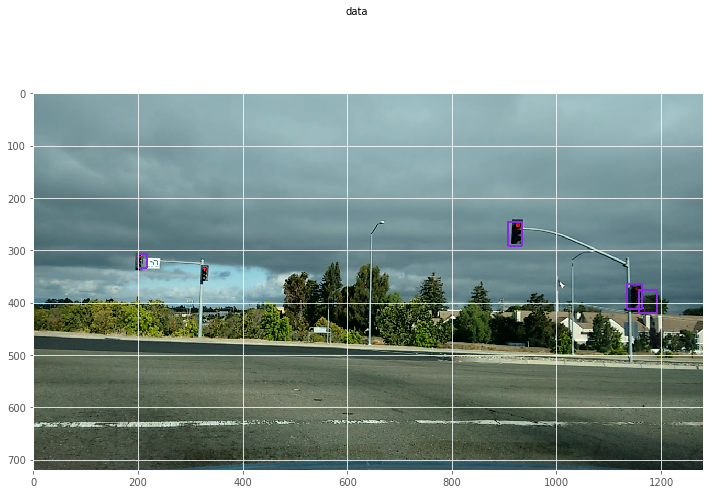

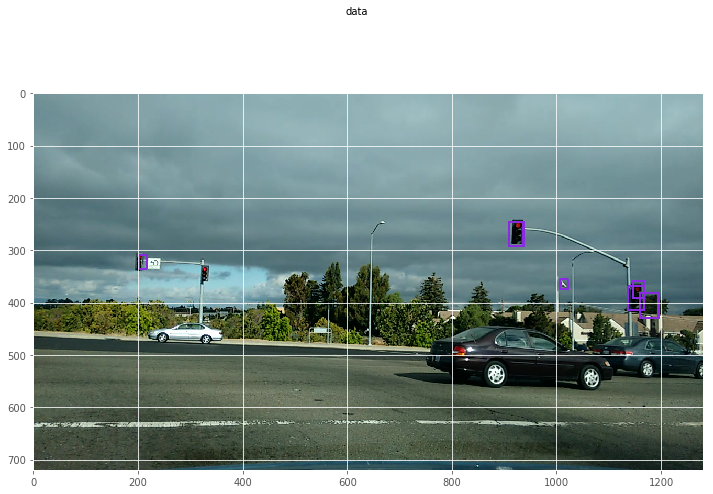

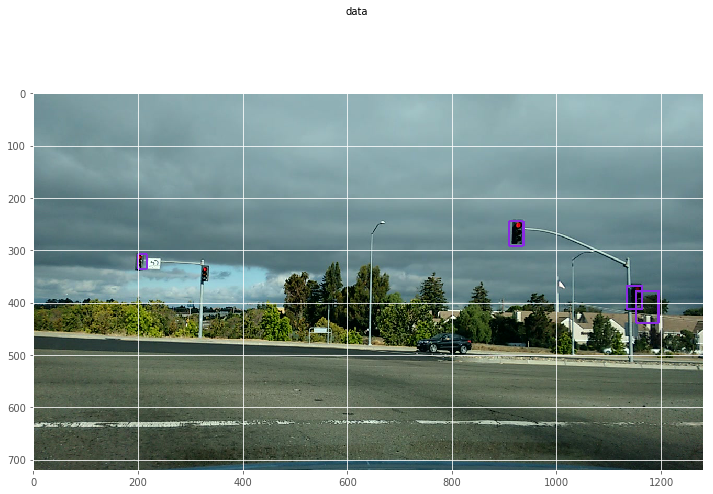

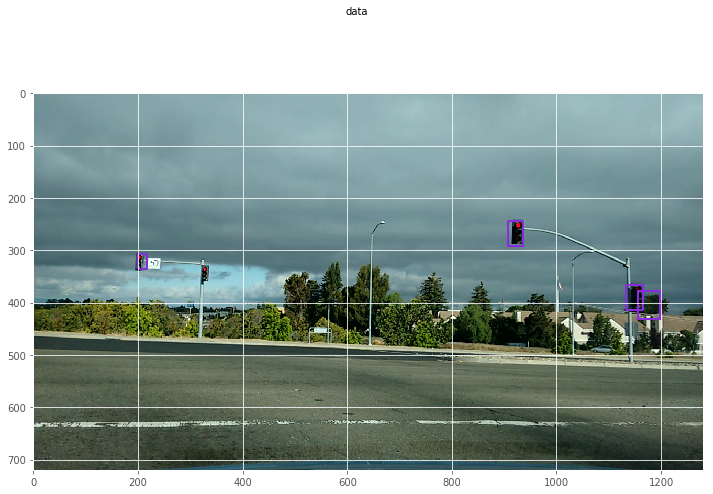

...

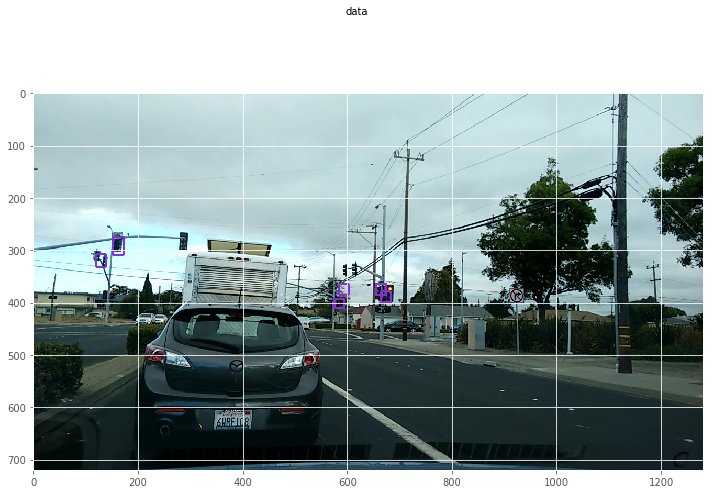

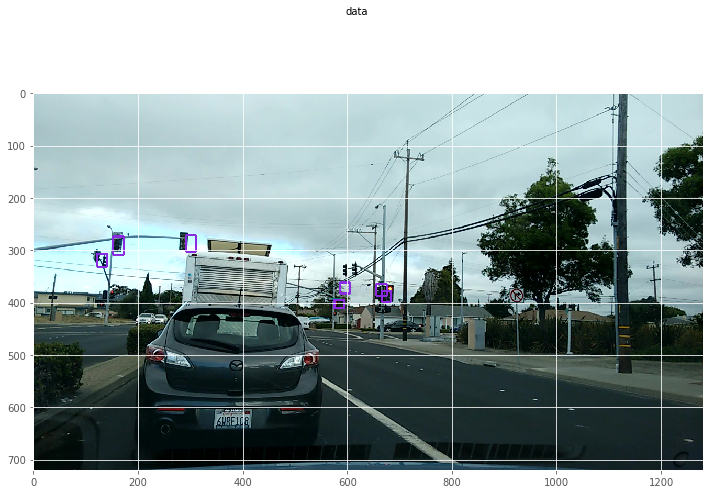

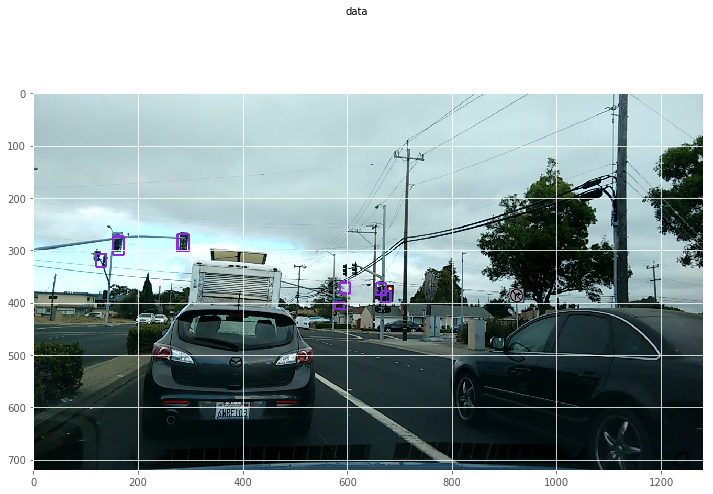

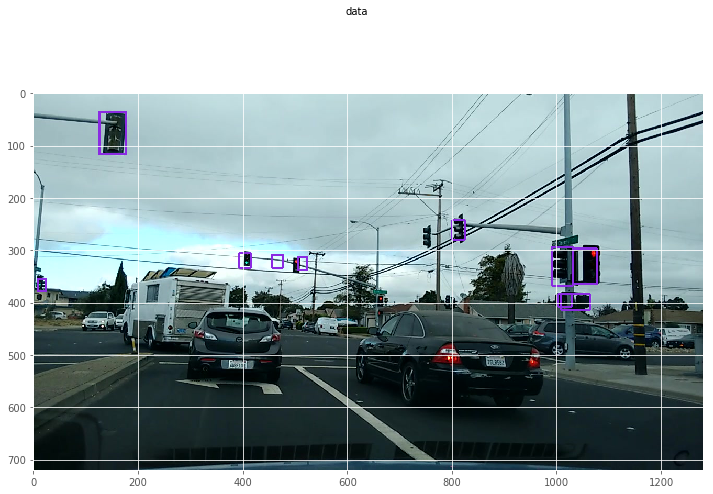

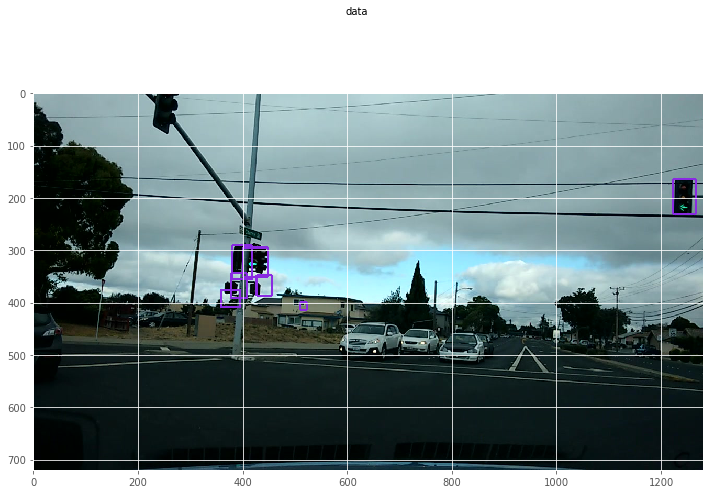

In [27]:
inception=frozen_model_paths[4]
print(inception)
detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(inception)
sess = tf.Session(graph=detection_graph)
for test_image in image_paths[0:200:10]:    
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    boxes,scores,classes,_ = detect(sess,
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  traffic_sign_class_id)
    #print(test_image)    
    confidence_cutoff = 0.16
    traffic_lights_class_id=10
    # Filter boxes with a confidence score less than `confidence_cutoff`
    boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, scores, classes,[traffic_lights_class_id])
    ilustrate_detection(image,boxes,classes,inception.split('/')[1])
print("done")    

## Detecting traffic lights with Mobilenet

/data/ab/tl/models/faster_rcnn_resnet101_bosch_2017_11_11/frozen_inference_graph.pb
test_images_nauto/004771.jpg
test_images_nauto/004921.jpg
test_images_nauto/005071.jpg
test_images_nauto/005551.jpg
test_images_nauto/005701.jpg
test_images_nauto/005851.jpg
test_images_nauto/006001.jpg
test_images_nauto/006151.jpg
test_images_nauto/006376.jpg
test_images_nauto/007141.jpg
test_images_nauto/007441.jpg
test_images_nauto/008536.jpg
test_images_nauto/009541.jpg
test_images_nauto/013081.jpg
test_images_nauto/013231.jpg
test_images_nauto/013381.jpg
test_images_nauto/013531.jpg
test_images_nauto/013741.jpg
test_images_nauto/013891.jpg
done


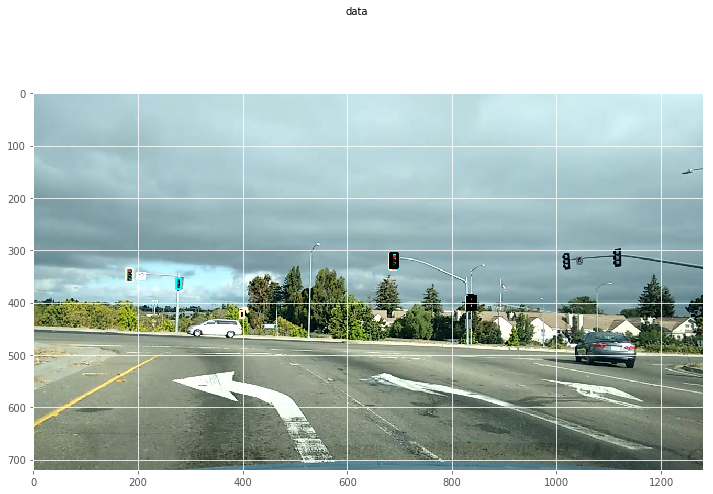

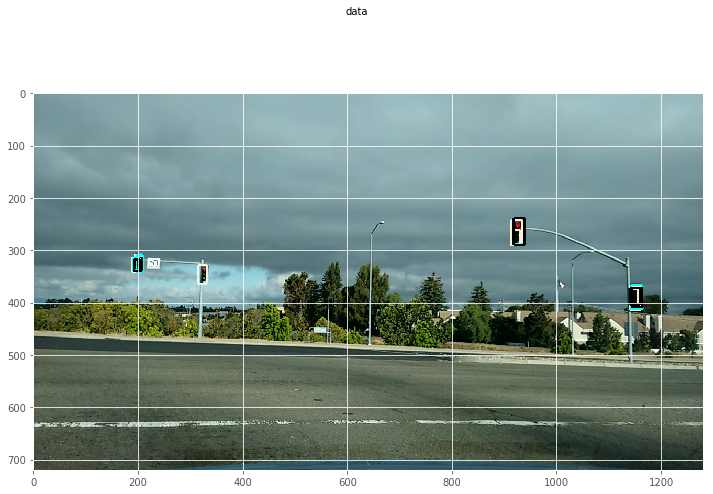

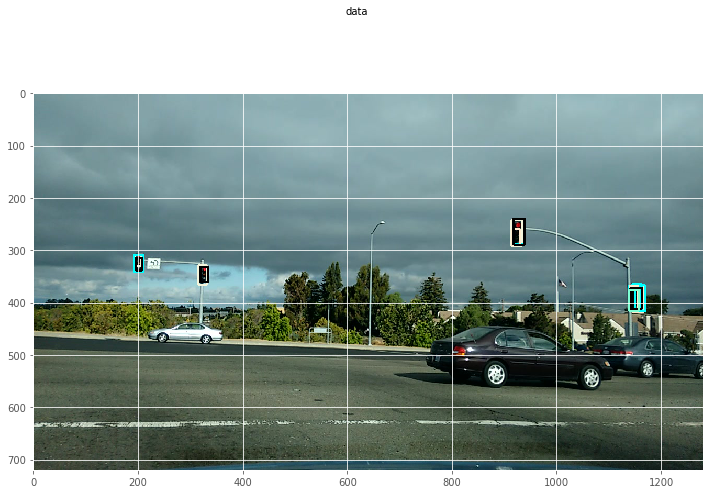

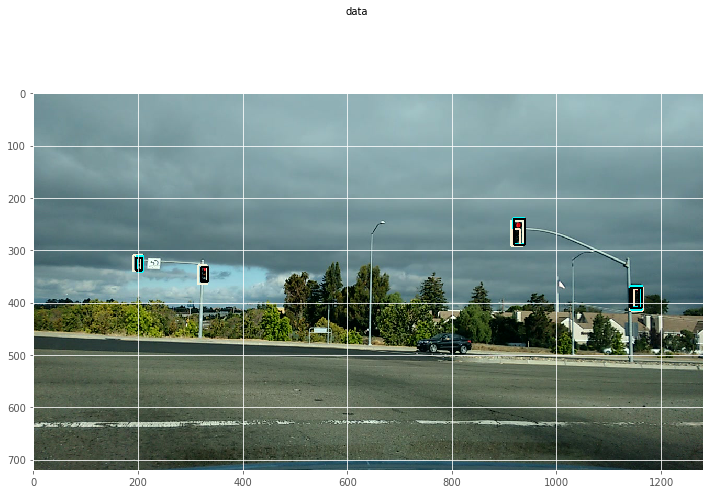

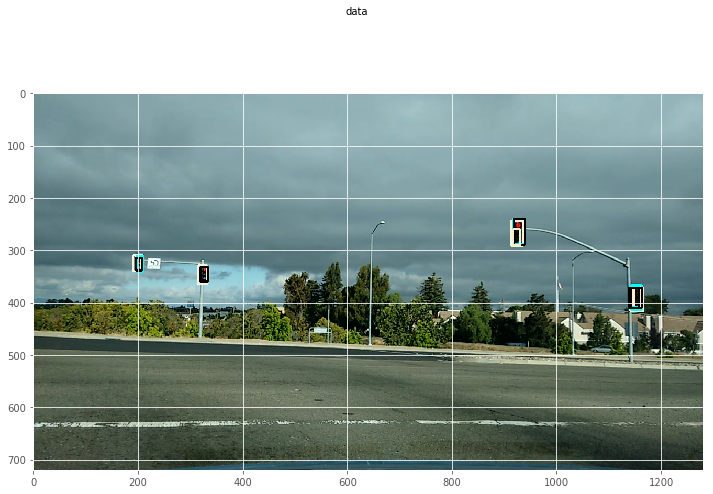

...

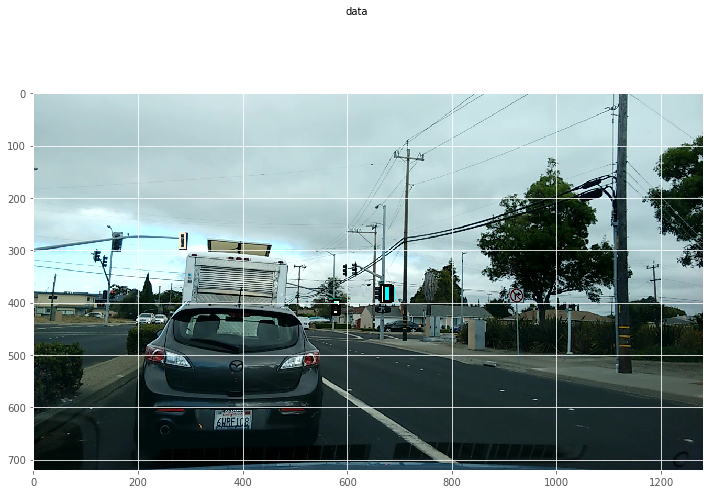

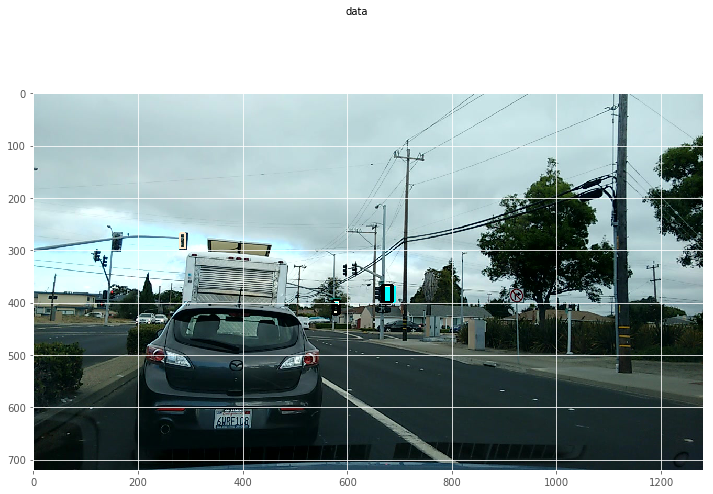

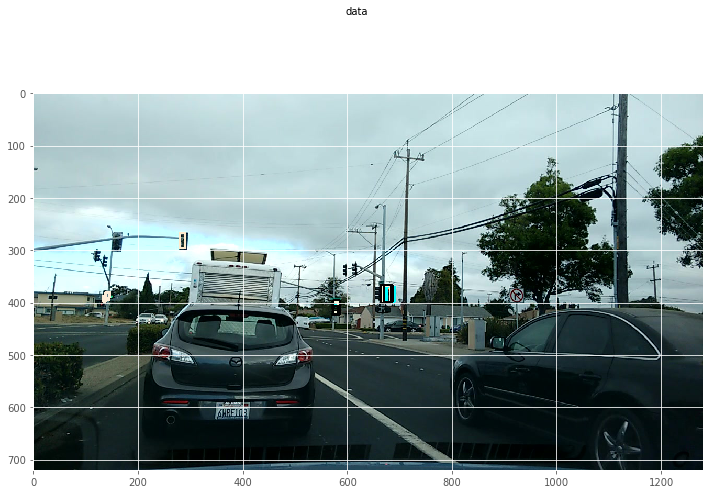

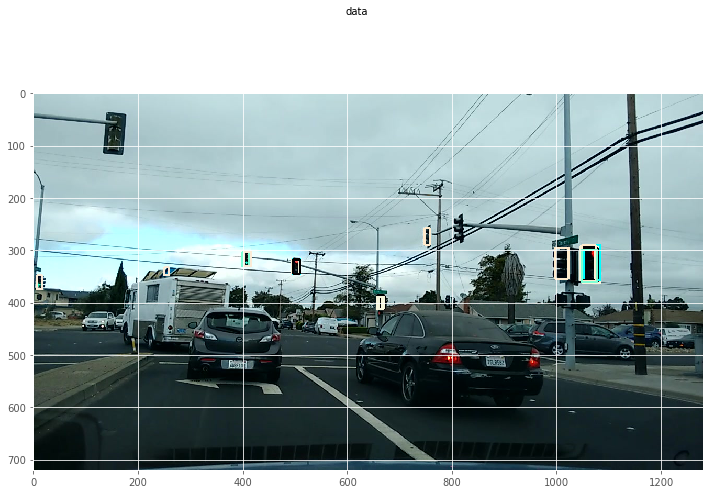

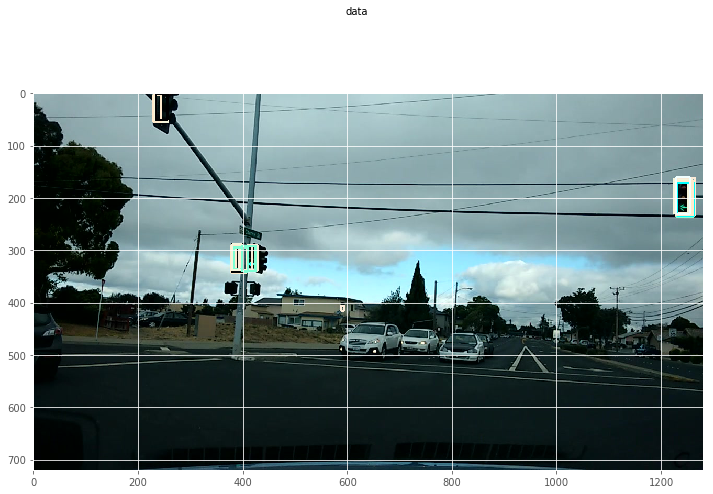

In [34]:
mobilenet=frozen_model_paths[18]
print(mobilenet)
detection_graph,image_tensor,detection_boxes,detection_scores,detection_classes = load_graph(mobilenet)
sess = tf.Session(graph=detection_graph)
for test_image in image_paths[0:200:10]:    
    image = Image.open(test_image)
    image_np = np.expand_dims(np.asarray(image, dtype=np.uint8), 0)
    boxes,scores,classes,times = detect(sess,
                                  image_tensor,
                                  detection_boxes,
                                  detection_scores,
                                  detection_classes,
                                  image_np,
                                  2)
    #print(scores)
    confidence_cutoff = 0.01
    traffic_lights_class_id=5
    # Filter boxes with a confidence score less than `confidence_cutoff`
    boxes, scores, classes = filter_boxes(confidence_cutoff, boxes, 
                                          scores, classes,range(15))
    #print(times)
    ilustrate_detection(image,boxes,classes,mobilenet.split('/')[1])
    print(test_image)
print("done")    

In [15]:
import sys
sys.path.append('/home/alexb/tensorflow/models/research/object_detection/')
sys.path.append('/home/alexb/tensorflow/models/research')
from utils import label_map_util
from utils import visualization_utils as vis_util

ImportError: No module named 'object_detection'